# Анализ заведений общественного питания Москвы

**Цель проекта**


Исследование проводится для помощи в открытии нового бизнеса инвесторами. Цель исследования -- выделение закономерностей на имеющемся рынке и формирование на их основе рекомендаций.

**Исходные данные**


Исходные данные взяты у сервисов Яндекс Карты и Яндекс Бизнес, актуальны на лето 2022 года; формат -- `csv`

## План работ

- Чтение и первичный анализ данных, импорт библиотек
- Предобработка данных
    - Пропуски
    - Неявные/явные дубликаты
    - Типы данных
    - Извлечь название улицы
    - Указатель на круглосуточную работу
- Общий анализ данных
    - Изучение категорий заведений
    - Сетевые точки питания
    - Рассмотрение районов, построение карт
    - Изучение улиц
    - Средний чек
- Детализация: открытие кофейни
    - Количество и районы
    - График работы
    - Рейтинг
    - Средний чек
- Общий вывод
- Подготовка слайдов

## Чтение данных и импорт библиотек

In [1]:
# pandas
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn'
pd.options.display.float_format = '{:,.2f}'.format

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# map tools
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# reading from local files
df = pd.read_csv('/Users/ilatti/Documents/practicum/11_sprint/project/moscow_places.csv')
state_geo = '/Users/ilatti/Documents/practicum/11_sprint/project/admin_level_geomap.geojson'

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,0,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,0,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,1,148.00


- Данные считались корректно
- В датасете ~ 8400 записей, если нет дублей, то это число -- количество заведений
- В данных есть пропуски
- Типы данных столбцов в основном соответствуют содержимому: можно оптимизировать столбец `chain` -- привести его к логическому типу; столбцы со средними значениями можно было бы привести к целочисленному типу, если бы не было пропусков

## Предобработка данных

### Пропуски 

Оценим количество пропусков в данных

In [5]:
# missing values visualization function

def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = 0, legend = False, fontsize = 16, grid = False)
            .set_title('Доля пропусков по столбцам, %' + "\n", fontsize = 22, color = 'SteelBlue')    
        );    
    except:
        print('пропусков не осталось :) ')

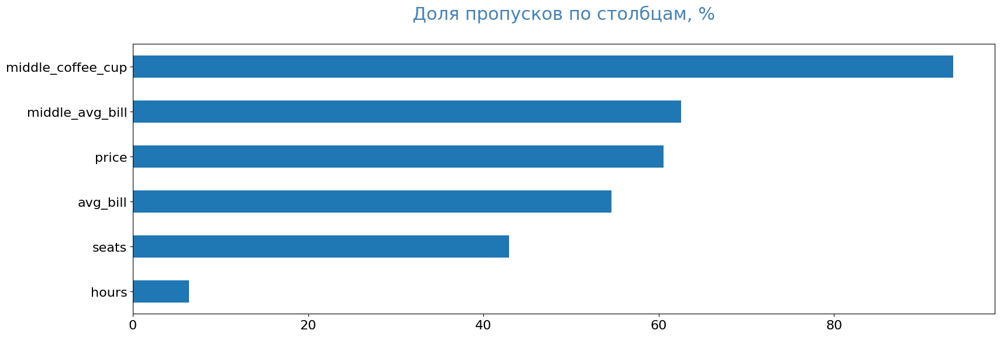

In [6]:
pass_value_barh(df)

- У множества записей не прописана средняя стоимость чашки кофе -- это нормально, не все заведения -- кофейни
- Пропусков в среднем чеке одним числом больше, чем пропусков в среднем чеке, заданном интервалом -- возможно, удастся заполнить часть данных
- Часы работы и количество мест для гостей заполнить самостоятельно не получится; ценовую категорию заполнять не будем -- в анализе она не пригодится, вместо нее будем ориентироваться на средний чек / среднюю цену чашки кофе

Количество незаполненых записей о цене чашки кофе для кофеен:

In [7]:
df.query('middle_coffee_cup.isna() and category == "кофейня"').shape[0]

892

Всего кофеен в датасете:

In [8]:
df.query('category == "кофейня"').shape[0]

1413

Сколько кофеен не имеют информации о цене чашки кофе, но имеют информацию в `avg_bill`? 

In [9]:
df.query('middle_coffee_cup.isna() and category == "кофейня" and avg_bill.isna() == False').shape[0]

200

In [10]:
df.query('middle_coffee_cup.isna() and category == "кофейня" and avg_bill.isna() == False').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.57,4.10,средние,Средний счёт:500–800 ₽,650.00,NaN,1,NaN
139,Шеф Бургер,кофейня,"Москва, Дмитровское шоссе, 116Д",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.90,37.55,4.10,средние,Средний счёт:300 ₽,300.00,NaN,1,120.00
254,Ай Эм Конфидент,кофейня,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 08:00–22:00",55.88,37.67,4.20,средние,Средний счёт:350–500 ₽,425.00,NaN,0,100.00
279,Сладкие минуты,кофейня,"Москва, Староватутинский проезд, 14",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.88,37.67,3.90,NaN,Средний счёт:260–300 ₽,280.00,NaN,0,100.00
299,Калитки,кофейня,"Москва, Фестивальная улица, 13, корп. 2",Северный административный округ,"пн-пт 08:00–21:00; сб,вс 09:00–21:00",55.86,37.48,4.50,средние,Средний счёт:300–500 ₽,400.00,NaN,1,90.00


Скорее всего, это те кофейни, у которых указан средний счет, вместо средней цены чашки кофе, проверим:

In [11]:
df.query('middle_coffee_cup.isna() and category == "кофейня" and avg_bill.isna() == False and avg_bill.str.contains("счёт") == False').shape[0]

0

Гипотеза подтвердилась: заполнить пропуски в цене чашки не сможем, т.к. при заполнении с опорой на средний счет получим завышенные значения (не все гости покупают одну чашку кофе, в чеке, скорее всего, должно быть что-то еще)

Сколько заведений, в которых не рассчитана медиана интервала среднего чека?

In [12]:
df.query('middle_avg_bill.isna() and avg_bill.isna() == False').shape[0]

667

In [13]:
df.query('middle_avg_bill.isna() and avg_bill.isna() == False').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,0,NaN
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.88,37.47,4.50,средние,Цена бокала пива:250–350 ₽,NaN,NaN,0,102.00
67,Штаб квартира,"бар,паб","Москва, Дубнинская улица, 32",Северный административный округ,"пн-чт 12:30–00:00; пт,сб 12:30–02:00; вс 12:30...",55.88,37.56,5.00,средние,Цена бокала пива:120–350 ₽,NaN,NaN,0,16.00
72,Лакрица,кофейня,"Москва, Алтуфьевское шоссе, 85",Северо-Восточный административный округ,"ежедневно, 08:00–21:00",55.89,37.59,4.50,средние,Цена чашки капучино:150–190 ₽,NaN,170.00,0,12.00
81,Coffee Way,кофейня,"Москва, Алтуфьевское шоссе, 86, корп. 1",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.90,37.59,4.30,NaN,Цена чашки капучино:120–170 ₽,NaN,145.00,1,120.00


Возможно, это те заведения, в которых нет величины среднего чека: вместо этого чашка кофе или бокал пива; проверим

In [14]:
df.query('middle_avg_bill.isna() and avg_bill.isna() == False and avg_bill.str.contains("счёт")').shape[0]

0

Гипотеза подтвердилась; заполнить пропуски снова не сможем, только в данном случае мы бы занизили средний чек

### Дубликаты

Сначала проведем проверку на неявные дубликаты в названиях

In [15]:
df.duplicated(subset=['category', 'lat', 'lng']).sum()

18

Обнаружено 18 заведений с совпадающими категорией и координатами, рассмотрим подробнее:

In [16]:
# adding new column with concatenated category and coordinates
df['check_col'] = df.category + df.lat.apply(str) + df.lng.apply(str) 
# extracting values of a new column to a separate Series 
duplicates = df[df.duplicated(subset=['category', 'lat', 'lng'])]['check_col']
# showing duplicates/originals
df[df.check_col.isin(duplicates)].sort_values(by='check_col')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,check_col
4242,Пельменная-вареничная,быстрое питание,"Москва, площадь Киевского Вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.74,37.57,3.40,NaN,Средний счёт:250–350 ₽,300.00,NaN,0,10.00,быстрое питание55.74304137.566494
4286,Пловная-чебуречная,быстрое питание,"Москва, площадь Киевского Вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.74,37.57,3.30,NaN,Средний счёт:250–350 ₽,300.00,NaN,0,10.00,быстрое питание55.74304137.566494
7407,Старый дворик,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.66,37.74,4.10,средние,Средний счёт:от 300 ₽,300.00,NaN,1,45.00,кафе55.65842437.737291
7362,Хинкальная,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.66,37.74,4.30,средние,Средний счёт:от 300 ₽,300.00,NaN,1,45.00,кафе55.65842437.737291
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.66,37.48,4.70,NaN,NaN,NaN,NaN,0,NaN,кафе55.66163837.480148
6534,Fibo Pasta & Ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.66,37.48,4.80,средние,Средний счёт:500–1000 ₽,750.00,NaN,1,NaN,кафе55.66163837.480148
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.67,37.48,3.60,NaN,NaN,NaN,NaN,0,"1,288.00",кафе55.66514237.478603
6762,Campus,кафе,"Москва, проспект Вернадского, 84с1",Западный административный округ,пн-пт 08:30–20:00; сб 08:30–17:00,55.67,37.48,2.80,NaN,NaN,NaN,NaN,1,NaN,кафе55.66514237.478603
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,0,86.00,кафе55.67002137.55248
7066,Кофе,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.67,37.55,5.00,NaN,NaN,NaN,NaN,1,86.00,кафе55.67002137.55248


Не все записи являются дублями, причина в неточности определения координат; но дубликаты все же есть, оставим те записи, в которых, больше информации. Индексы дублей:

2841, 5316, 1324, 1430

Поскольку пропусков в категориях и координатах нет, то, скорее всего, это все дубликаты в названиях

In [17]:
df_un = df.copy()
df_un = df_un.drop(index=[2841, 5316, 1324, 1430])
df_un[df_un.check_col.isin(duplicates)].sort_values(by='check_col')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,check_col
4242,Пельменная-вареничная,быстрое питание,"Москва, площадь Киевского Вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.74,37.57,3.40,NaN,Средний счёт:250–350 ₽,300.00,NaN,0,10.00,быстрое питание55.74304137.566494
4286,Пловная-чебуречная,быстрое питание,"Москва, площадь Киевского Вокзала, 1",Западный административный округ,"ежедневно, круглосуточно",55.74,37.57,3.30,NaN,Средний счёт:250–350 ₽,300.00,NaN,0,10.00,быстрое питание55.74304137.566494
7407,Старый дворик,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.66,37.74,4.10,средние,Средний счёт:от 300 ₽,300.00,NaN,1,45.00,кафе55.65842437.737291
7362,Хинкальная,кафе,"Москва, улица Нижние Поля, 19Б, стр. 1",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.66,37.74,4.30,средние,Средний счёт:от 300 ₽,300.00,NaN,1,45.00,кафе55.65842437.737291
6549,Bổ,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,"пн-чт 10:00–23:00; пт,сб 10:00–00:00; вс 11:00...",55.66,37.48,4.70,NaN,NaN,NaN,NaN,0,NaN,кафе55.66163837.480148
6534,Fibo Pasta & Ravioli,кафе,"Москва, проспект Вернадского, 86В",Западный административный округ,пн-сб 10:00–22:00; вс 11:00–22:00,55.66,37.48,4.80,средние,Средний счёт:500–1000 ₽,750.00,NaN,1,NaN,кафе55.66163837.480148
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,пн-пт 09:00–20:00; сб 09:00–16:00,55.67,37.48,3.60,NaN,NaN,NaN,NaN,0,"1,288.00",кафе55.66514237.478603
6762,Campus,кафе,"Москва, проспект Вернадского, 84с1",Западный административный округ,пн-пт 08:30–20:00; сб 08:30–17:00,55.67,37.48,2.80,NaN,NaN,NaN,NaN,1,NaN,кафе55.66514237.478603
7066,Кофе,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 10:00–21:00",55.67,37.55,5.00,NaN,NaN,NaN,NaN,1,86.00,кафе55.67002137.55248
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,0,86.00,кафе55.67002137.55248


In [18]:
df_un = df_un.drop(columns='check_col')

Проверим дубликаты в названиях округов

In [19]:
df_un.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Дубликатов нет

Наконец, проверим наличие полных явных дубликатов

In [20]:
df_un.duplicated().sum()

0

Полных дубликатов не обнаружено

### Типы данных

Изменим тип данных столбца с указанием на то, сетевое ли заведение:

In [21]:
df_un.chain = df_un.chain.apply(lambda x: True if x == 1 else False)
print(df_un.info())
df_un.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7866 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   bool   
 13  seats              4793 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 927.2+ KB
None


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,False,4.00
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,False,45.00
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,False,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,True,148.00


### Дополнительные столбцы

Добавим столбец с названием улицы:

In [22]:
# creating df with divided address
street_df = df_un.address.str.split(', ', expand=True)
street_df.columns=[0, 'street', 2, 3, 4, 5]
street_df.head()

,0,street,2,3,4,5
0,Москва,улица Дыбенко,7/1,None,None,None
1,Москва,улица Дыбенко,36,корп. 1,None,None
2,Москва,Клязьминская улица,15,None,None,None
3,Москва,улица Маршала Федоренко,12,None,None,None
4,Москва,Правобережная улица,1Б,None,None,None


In [23]:
# leaving only street name
street_df = street_df.street
street_df

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8402, dtype: object

In [24]:
# adding street name to main df
df_un = df_un.join(street_df)
df_un.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,5.00,NaN,NaN,NaN,NaN,False,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.48,4.50,выше среднего,Средний счёт:1500–1600 ₽,"1,550.00",NaN,False,4.00,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.89,37.53,4.60,средние,Средний счёт:от 1000 ₽,"1,000.00",NaN,False,45.00,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.88,37.49,5.00,NaN,Цена чашки капучино:155–185 ₽,NaN,170.00,False,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.88,37.45,5.00,средние,Средний счёт:400–600 ₽,500.00,NaN,True,148.00,Правобережная улица


In [25]:
df_un.tail()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.67,37.55,4.40,NaN,NaN,NaN,NaN,False,86.00,Профсоюзная улица
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.64,37.66,4.80,NaN,NaN,NaN,NaN,False,150.00,Пролетарский проспект
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,3.90,NaN,Средний счёт:от 150 ₽,150.00,NaN,False,150.00,Люблинская улица
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.65,37.74,4.20,NaN,NaN,NaN,NaN,True,150.00,Люблинская улица
8405,Kebab Time,кафе,"Москва, Россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.60,37.60,3.90,NaN,NaN,NaN,NaN,False,12.00,Россошанский проезд


Извлечение названия улицы корректно

Добавим столбец с указателем на работу заведения в режиме 24 / 7:

In [26]:
# searching for indexes of around-the-clock places
index_24_7 = (df_un.query('hours.isna() == False')
              .query('hours.str.contains("ежеднев") and hours.str.contains("круглосут")').index.to_list())

In [27]:
df_un['is_24_7'] = False
df_un.loc[index_24_7, 'is_24_7'] = True
df_un.query('is_24_7 == True').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
10,Great Room Bar,"бар,паб","Москва, Левобережная улица, 12",Северный административный округ,"ежедневно, круглосуточно",55.88,37.47,4.50,средние,Цена бокала пива:250–350 ₽,NaN,NaN,False,102.00,Левобережная улица,True
17,Чайхана Беш-Бармак,ресторан,"Москва, Ленинградское шоссе, 71Б, стр. 2",Северный административный округ,"ежедневно, круглосуточно",55.88,37.45,4.40,средние,Средний счёт:350–500 ₽,425.00,NaN,False,96.00,Ленинградское шоссе,True
19,Пекарня,булочная,"Москва, Ижорский проезд, 5",Северный административный округ,"ежедневно, круглосуточно",55.89,37.52,4.40,NaN,NaN,NaN,NaN,True,NaN,Ижорский проезд,True
24,Drive Café,кафе,"Москва, улица Дыбенко, 9Ас1",Северный административный округ,"ежедневно, круглосуточно",55.88,37.48,4.00,NaN,NaN,NaN,NaN,True,NaN,улица Дыбенко,True
49,2U-Ту-Ю,пиццерия,"Москва, Ижорская улица, 8А",Северный административный округ,"ежедневно, круглосуточно",55.89,37.51,2.70,NaN,Средний счёт:900 ₽,900.00,NaN,False,NaN,Ижорская улица,True


### **Вывод**

- Все пропуски оставили как есть
- Удалены четыре строки с дублирующимися заведениями;
- Изменен тип данных указателя на то, сетевое ли заведение: `int` -> `bool`
- Добавлены столбцы с названием улицы и указателем на круглосуточный и ежедневный характер работы.

## Общий анализ данных

Оценим распределение заведений по категориям

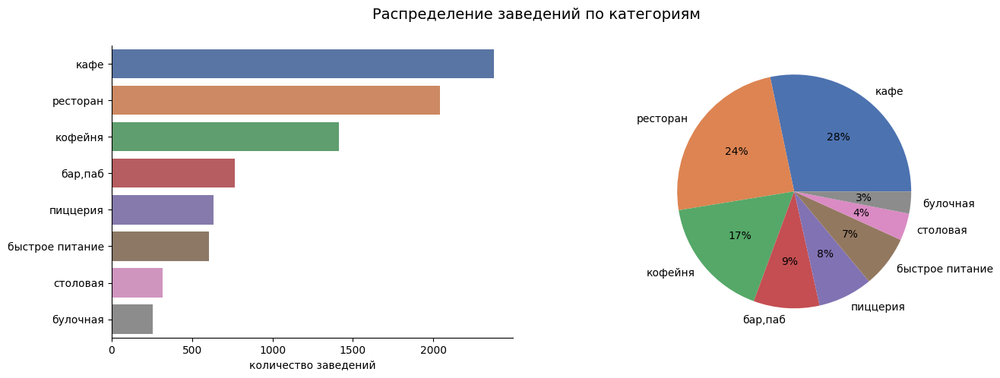

In [28]:
categories = df_un.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)


fig, ax = plt.subplots(1, 2)
fig.set_size_inches(15, 5)
fig.suptitle('Распределение заведений по категориям \n', fontsize = 14)

# barplot with category size rating
sns.set_palette('deep')
sns.barplot(ax=ax[0], data=categories, x='name', y='category')
ax[0].set(ylabel = None,
         xlabel='количество заведений')
ax[0].spines['top'].set_visible(False)
ax[0].spines['right'].set_visible(False)

# pie chart
colors = sns.color_palette('deep')
ax[1].pie(categories.name, labels=categories.category, colors=colors, autopct='%1.0f%%')

plt.show()

- В столице больше всего кафе, ресторанов и кофеен
- Меньше всего заведений категорий булочная, столовая, быстрое питание
- Промежуточное место занимают бары и пиццерии
- Суммарно кафе и рестораны составляют чуть больше половины всех точек общепита

Оценим количество посадочных мест по категориям

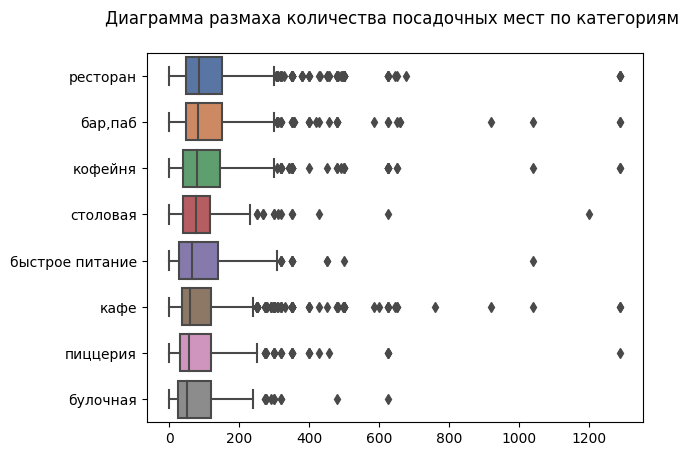

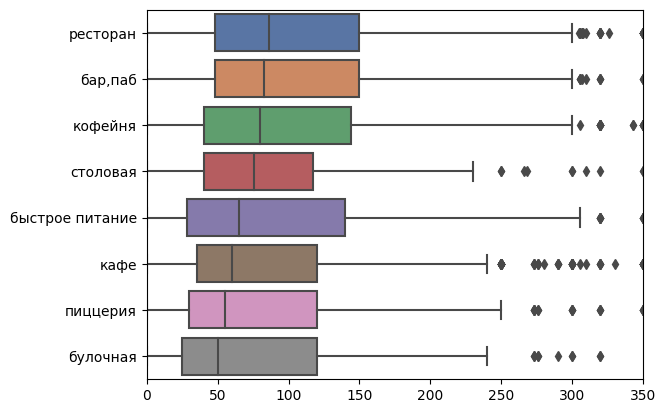

In [29]:
order = df_un.groupby('category')['seats'].median().sort_values(ascending=False).index

sns.boxplot(x="seats", y="category", data=df_un, order=order)
plt.title('Диаграмма размаха количества посадочных мест по категориям \n')
plt.ylabel(None)
plt.xlabel(None)
plt.show()

sns.boxplot(x="seats", y="category", data=df_un, order=order)
plt.ylabel(None)
plt.xlabel(None)
plt.xlim(0, 350)
plt.show()

- По медианному количеству посадочных мест лидируют рестораны, бары и кофейни
- Меньше всего медиана у булочных, пиццерий и кафе
- Категория быстрого питания занимает промежуточное положение в рейтинге по медиане, однако, обладает достаточно большим разбросом за счет межквартиального размаха: граница выбросов у этой категории даже немного превышает лидеров
- Наиболее популярный вид заведения в Москве -- кафе, при этом медианное количество посадочных мест по этой категории третье с конца
- Если есть возможность и желание открыть большое заведение, то, скорее всего, это будет ресторан или бар
- К промежуточным по размерам заведениям относятся кофейни и столовые, а также заведения быстрого питания
- Если открывать небольшое заведение, то имеет смысл обратить внимание на кафе, пиццерии и булочные

Изучим соотношение сетевых и несетевых заведений

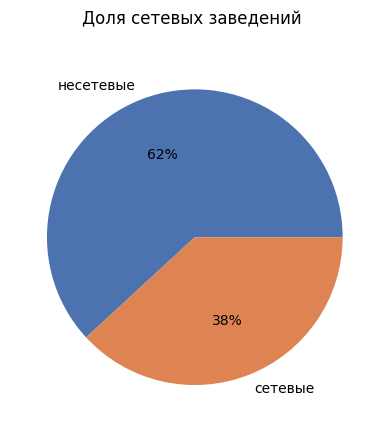

In [30]:
chain_cnt = df_un.groupby('chain')['name'].count().reset_index()

fig, ax = plt.subplots()
ax.pie(data=chain_cnt, x='name', labels=['несетевые', 'сетевые'], colors=colors, autopct='%1.0f%%')
ax.set_title('Доля сетевых заведений \n')
plt.show()

Сетевыми являются около 40 % заведений, подавляющее большинство заведений являются самостоятельными

In [31]:
chain_ratio = df_un.groupby('category')['chain'].mean().reset_index().sort_values(by='chain', ascending=False)
chain_ratio.chain *= 100

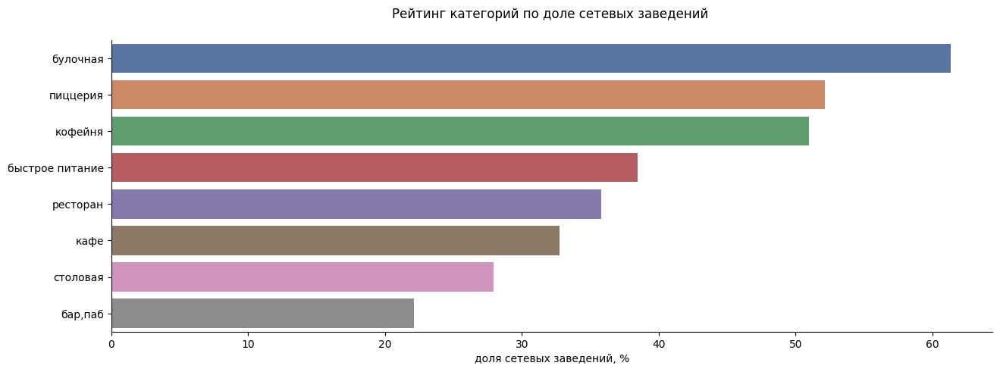

In [32]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 5)

sns.barplot(ax=ax, data=chain_ratio, x='chain', y='category')
ax.set(ylabel = None,
         xlabel='доля сетевых заведений, %',
      title='Рейтинг категорий по доле сетевых заведений \n')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

- В категориях булочных, пиццерий и кофеен более половины всех заведений -- сетевые
- Меньше всего сетевых заведений в категориях баров, столовых и кафе

Рассмотрим самые популярные сети в Москве

In [33]:
top_chains = (df_un.query('chain == True')
              .groupby('name')
              .agg({'address':'count', 'category':'first', 'rating':'median', 'price':'first'})
              .reset_index()
              .sort_values(by='address', 
                           ascending=False)
              .head(15))
top_chains.columns = ['name', 'cnt', 'category', 'median_rating', 'price_cat']

In [34]:
fig = px.bar(top_chains.sort_values(by='cnt'), 
             x='cnt', 
             y='name', 
             title='Топ-15 сетевых заведений',
             text='cnt',
             labels={'name':'', 'cnt':'Количество заведений в сети'})
fig.update_xaxes(visible=False)
fig.show()

- Самая популярная сеть в Москве с большим отрывом -- Шоколадница
- На втором и третьем месте с почти одинаковым количеством заведений Домино'с и Додо
- Замыкает топ-15 сеть Му-Му

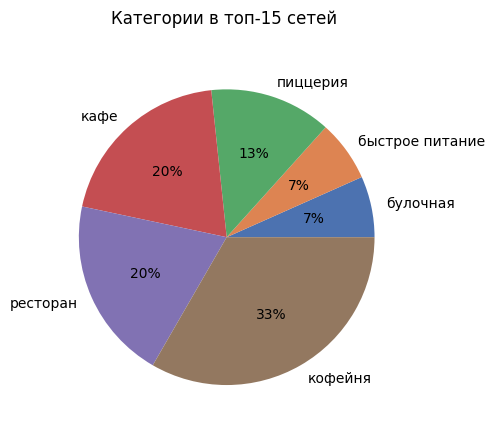

In [35]:
top_chains_cat = top_chains.groupby('category')['name'].count().reset_index().sort_values(by='name')

fig, ax = plt.subplots()
ax.pie(data=top_chains_cat, x='name', labels='category', colors=colors, autopct='%1.0f%%')
ax.set_title('Категории в топ-15 сетей \n')
plt.show()

- Треть популярных сетей -- кофейни
- Кафе и рестораны составляют по 20 % от топ-15
- Наименее популярные категории в топ-15 -- фастфуд и булочные

In [36]:
top_chains

,name,cnt,category,median_rating,price_cat
746,Шоколадница,120,кофейня,4.20,средние
344,Домино'с Пицца,76,пиццерия,4.20,средние
340,Додо Пицца,74,пиццерия,4.30,средние
148,One Price Coffee,71,кофейня,4.20,средние
759,Яндекс Лавка,69,ресторан,4.00,None
59,Cofix,65,кофейня,4.10,средние
170,Prime,50,ресторан,4.20,низкие
679,Хинкальная,44,быстрое питание,4.40,средние
378,КОФЕПОРТ,42,кофейня,4.20,низкие
431,Кулинарная лавка братьев Караваевых,39,кафе,4.40,средние


In [37]:
print(f'Медианный рейтинг по всем заведениям Москвы: {df_un.rating.median()}')

Медианный рейтинг по всем заведениям Москвы: 4.3


- Практически все сети в топ-15 ценовой категории "средние", исключение -- Prime и КОФЕПОРТ, относящиеся к низкому ценовому сегменту
- Медианный рейтинг заведений сетей примерно соответствует среднему по Москве

Рассмотрим распределение заведений по районам города

In [38]:
district_vs_cat = (df_un.pivot_table(index='district', 
                                     columns='category', 
                                     values='name', 
                                     aggfunc='count')
                   .reset_index())
# deleting common part in the names of districts 
district_vs_cat.district = district_vs_cat.district.str.replace(' административный округ', '')

district_vs_cat['итого'] = district_vs_cat.loc[:, 'бар,паб':].sum(axis=1)
district_vs_cat = district_vs_cat.sort_values(by='итого')
district_vs_cat

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,итого
4,Северо-Западный,23,12,30,115,62,40,109,18,409
7,Юго-Западный,38,27,61,238,96,64,168,17,709
6,Юго-Восточный,38,13,67,282,89,55,145,25,714
0,Восточный,53,25,71,271,105,72,159,40,796
1,Западный,50,37,62,239,150,71,218,24,851
3,Северо-Восточный,63,28,82,269,159,68,182,40,891
8,Южный,68,25,85,264,131,73,202,44,892
2,Северный,68,39,58,235,193,77,187,41,898
5,Центральный,364,50,87,464,428,113,670,66,2242


In [39]:
# sorting categories inside districts

cols_n_w = district_vs_cat.loc[5, :].reset_index()
cols_n_w.columns = ['category', 'cnt']
cols_n_w.loc[0, 'cnt'] = 5000
cols_n_w = cols_n_w.sort_values(by='cnt', ascending=False)
cols_n_w = cols_n_w.drop(columns='cnt')
cols = cols_n_w.category.tolist()
district_vs_cat = district_vs_cat[cols]
cols = cols[2:] # only target columns are used
district_vs_cat

category,district,итого,ресторан,кафе,кофейня,"бар,паб",пиццерия,быстрое питание,столовая,булочная
4,Северо-Западный,409,109,115,62,23,40,30,18,12
7,Юго-Западный,709,168,238,96,38,64,61,17,27
6,Юго-Восточный,714,145,282,89,38,55,67,25,13
0,Восточный,796,159,271,105,53,72,71,40,25
1,Западный,851,218,239,150,50,71,62,24,37
3,Северо-Восточный,891,182,269,159,63,68,82,40,28
8,Южный,892,202,264,131,68,73,85,44,25
2,Северный,898,187,235,193,68,77,58,41,39
5,Центральный,2242,670,464,428,364,113,87,66,50


In [40]:
fig = px.bar(district_vs_cat, 
             x=cols, 
             y='district', 
             title="Количество заведений по районам Москвы")
fig.update_xaxes(title='Количество заведений')
fig.update_yaxes(title='')
fig.update_layout(legend_title='Категории')
fig.show()

- В датасете представлены все девять округов Москвы
- Центральный округ с большим отрывом на первом месте по количеству заведений
- В Центральном округе ресторанов больше, чем кафе, а в остальных округах наоборот; в остальном распределение по категориям повторяется
- Последний по количеству заведений -- Северо-Западный округ, количество точек общепита здесь почти вдвое меньше, чем у предпоследнего места

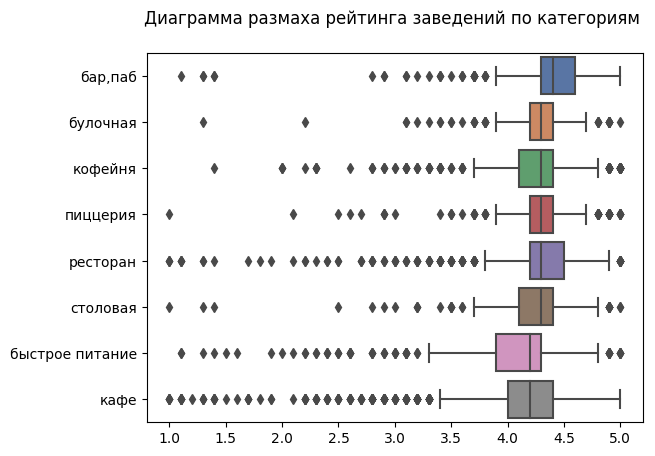

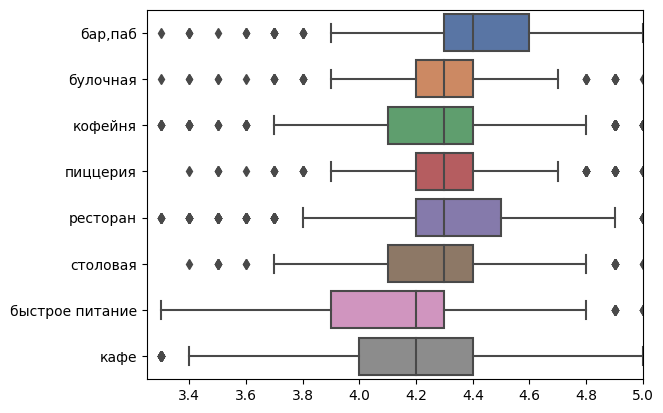

In [41]:
order = df_un.groupby('category')['rating'].median().sort_values(ascending=False).index

sns.boxplot(x="rating", y="category", data=df_un, order=order)
plt.title('Диаграмма размаха рейтинга заведений по категориям \n')
plt.ylabel(None)
plt.xlabel(None)
plt.show()

sns.boxplot(x="rating", y="category", data=df_un, order=order)
plt.ylabel(None)
plt.xlabel(None)
plt.xlim(3.25, 5)
plt.show()

- Больше всего гостям нравятся бары -- у них самый высокий медианный рейтинг из всех категорий, высшая оценка в диапазоне нормальных значений, а оценки ниже 3.9 можно считать выбросами
- Самые низкие оценки получают заведения категории фастфуд: оценки выше 4.8 относятся к выбросам, медианный рейтинг 4.2 -- один из двух самых низких в данных, 25 % всех заведений имеют оценку ниже 3.9, при этом совсем редкие низкие оценки начинаются с 3.3 и меньше
- Медианный рейтинг у кафе на уровне рейтинга заведений фастфуда, т.е. самый низкий из представленный категорий, однако распределение рейтинга у кафе смещено вправо относительно фастфуда: высшая оценка в диапазоне нормальных значений, 25 % заведений имеют оценку 4.4 и выше, а выбросы для низких оценок начинаются с оценки 3.4
- Оставшиеся категории имеют одинаковый медианный рейтинг, но есть разница в распределении: лучше всех оценены рестораны, следом идут пиццерии и булочные, имеющие одинаковое распределение, затем кофейни и столовые также с очень похожими распределениями
- Следует отметить, что категории заведений неравномерны по размеру, различие в распределениях рейтингов может быть продиктовано несимметричностью
- Можно составить вероятностный рейтинг создания приятного для гостей бизнеса:

    1) Бар
    2) Ресторан
    3) Пиццерия, булочная
    4) Кофейня, столовая
    5) Кафе
    6) Быстрое питание

Визуализируем средний рейтинг заведений по районам на карте

In [42]:
district_vs_rating = (df_un.groupby('district')['rating']
                      .mean()
                      .reset_index()
                      .sort_values(by='rating', 
                                   ascending=False))
district_vs_rating

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [43]:
# coordinates of Moscow center
moscow_lat, moscow_lng = 55.751244, 37.618423
# creating a map
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# showing ratings
Choropleth(
    geo_data=state_geo,
    data=district_vs_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(moscow_map)

moscow_map

- Заведения с самым высоким средним рейтингом расположены в Центральном округе;
- Северный и Северо-Западный округи занимают второе и третье место;
- Самые низкие оценки получают заведения в Юго-Восточном округе.

Визуализируем все заведения датасета на карте:

In [44]:
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# creating empty cluster
claster_catering = MarkerCluster().add_to(moscow_map)

# function for adding a marker to a cluster
def filling_claster(row):
    Marker([row['lat'], row['lng']],
           popup=f'{row["name"]} {row["rating"]} \n {row["price"]}').add_to(claster_catering)

df_un.apply(filling_claster, axis=1)
moscow_map

Карта согласуется с ранее полученными данными: основная масса заведений общепита сосредоточена в центре города

Найдем топ-15 улиц по количеству заведений:

In [45]:
street_vs_cat = (df_un.pivot_table(index='street', 
                                     columns='category', 
                                     values='name', 
                                     aggfunc='count')
                   .reset_index())

street_vs_cat['итого'] = street_vs_cat.loc[:, 'бар,паб':].sum(axis=1)
street_vs_cat = street_vs_cat.sort_values(by='итого', ascending=False).head(15)
street_vs_cat

category,street,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,итого
1090,проспект Мира,12.00,4.00,21.00,53.00,36.00,11.00,45.00,2.00,184.00
773,Профсоюзная улица,6.00,4.00,15.00,35.00,18.00,15.00,26.00,3.00,122.00
1087,проспект Вернадского,7.00,1.00,12.00,25.00,16.00,12.00,33.00,2.00,108.00
525,Ленинский проспект,10.00,3.00,2.00,26.00,23.00,5.00,33.00,5.00,107.00
523,Ленинградский проспект,15.00,4.00,2.00,12.00,25.00,9.00,25.00,3.00,95.00
373,Дмитровское шоссе,6.00,2.00,10.00,23.00,11.00,8.00,24.00,4.00,88.00
455,Каширское шоссе,2.00,NaN,10.00,20.00,16.00,5.00,19.00,5.00,77.00
298,Варшавское шоссе,6.00,NaN,7.00,18.00,14.00,4.00,20.00,7.00,76.00
524,Ленинградское шоссе,5.00,2.00,5.00,13.00,13.00,3.00,26.00,3.00,70.00
550,МКАД,1.00,NaN,9.00,45.00,4.00,NaN,5.00,1.00,65.00


In [46]:
# sorting categories inside districts

cols_mira_av = street_vs_cat.loc[1090, :].reset_index()
cols_mira_av.columns = ['category', 'cnt']
cols_mira_av.loc[0, 'cnt'] = 5000
cols_mira_av = cols_mira_av.sort_values(by='cnt', ascending=False)
cols_mira_av = cols_mira_av.drop(columns='cnt')
cols = cols_mira_av.category.tolist()
street_vs_cat = street_vs_cat[cols]
cols = cols[2:] # only target columns left
street_vs_cat

category,street,итого,кафе,ресторан,кофейня,быстрое питание,"бар,паб",пиццерия,булочная,столовая
1090,проспект Мира,184.00,53.00,45.00,36.00,21.00,12.00,11.00,4.00,2.00
773,Профсоюзная улица,122.00,35.00,26.00,18.00,15.00,6.00,15.00,4.00,3.00
1087,проспект Вернадского,108.00,25.00,33.00,16.00,12.00,7.00,12.00,1.00,2.00
525,Ленинский проспект,107.00,26.00,33.00,23.00,2.00,10.00,5.00,3.00,5.00
523,Ленинградский проспект,95.00,12.00,25.00,25.00,2.00,15.00,9.00,4.00,3.00
373,Дмитровское шоссе,88.00,23.00,24.00,11.00,10.00,6.00,8.00,2.00,4.00
455,Каширское шоссе,77.00,20.00,19.00,16.00,10.00,2.00,5.00,NaN,5.00
298,Варшавское шоссе,76.00,18.00,20.00,14.00,7.00,6.00,4.00,NaN,7.00
524,Ленинградское шоссе,70.00,13.00,26.00,13.00,5.00,5.00,3.00,2.00,3.00
550,МКАД,65.00,45.00,5.00,4.00,9.00,1.00,NaN,NaN,1.00


Визуализируем распределение заведений в топ-15 улиц:

In [47]:
fig = px.bar(street_vs_cat.sort_values(by='итого'), 
             x=cols, 
             y='street', 
             title="Заведения в топ-15 улиц Москвы")
fig.update_xaxes(title='Количество заведений')
fig.update_yaxes(title='')
fig.update_layout(legend_title='Категории')
fig.show()

- Улицы с самым большим количеством заведений в Москве это: проспект Мира, Профсоюзная улица и проспект Вернадского
- Самые популярные категории заведений сохраняются: кафе, рестораны и кофейни
- Большое исключение МКАД -- здесь абсолютно доминируют кафе

Найдем улицы, на которых только одно заведение общепита:

In [48]:
street_vs_cat = (df_un.pivot_table(index='street', 
                                     columns='category', 
                                     values='name', 
                                     aggfunc='count')
                   .reset_index())

street_vs_cat['итого'] = street_vs_cat.loc[:, 'бар,паб':].sum(axis=1)

lonely_streets = street_vs_cat.query('итого == 1')['street']

lonely_streets_df = df_un.query('street in(@lonely_streets)')
print(f'В Москве {lonely_streets_df.shape[0]} улиц, где всего одно заведения общепита')

В Москве 458 улиц, где всего одно заведения общепита


Сравним распределение пользовательских оценок по категориям заведений на этих улицах и по всей Москве:

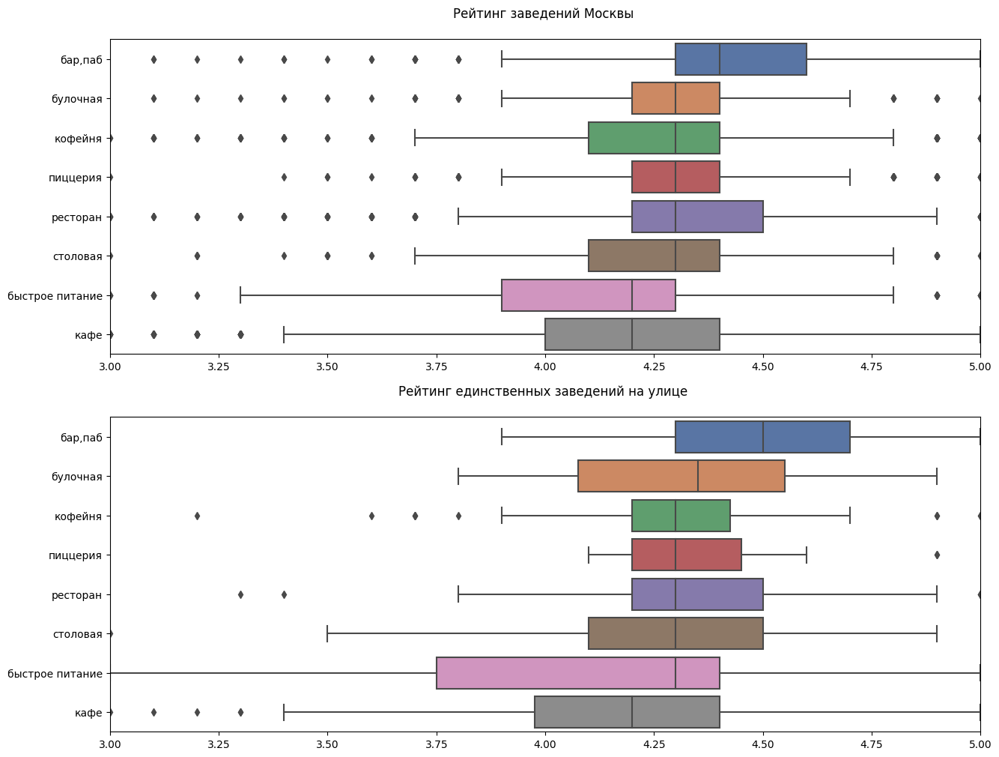

In [49]:
fig, ax = plt.subplots(2, 1)

fig.set_size_inches(15, 12)
sns.boxplot(x="rating", y="category", data=df_un, order=order, ax=ax[0])
ax[0].set(title='Рейтинг заведений Москвы \n',
         ylabel=None,
         xlabel=None,
         xlim=(3, 5))


sns.boxplot(x="rating", y="category", data=lonely_streets_df, order=order, ax=ax[1])
plt.title('Рейтинг единственных заведений на улице \n')
ax[1].set(title='Рейтинг единственных заведений на улице \n',
         ylabel=None,
         xlabel=None,
         xlim=(3, 5))

plt.show()

- Единственные заведения на своей улице, относящиеся к категориям баров, булочных, кофеен, пиццерий и столовых имеют лучшие оценки в сравнении со всеми заведениями в городе: медиана смещена вправо, либо третий квартиль смещен вправо, либо все сразу
- Рестораны и кафе имеют примерно те же оценки, что и в целом по городу
- Заведения фастфуда имеют смещенную медиану, что говорит о том, что такие заведения в среднем лучше, но первый квартиль у них сильно смещен влево: достаточно много заведений с более низкими оценками, чем в целом по городу

Сравним распределение по доле категорий заведений по всему городу и по заведениям, единственным на своей улице:

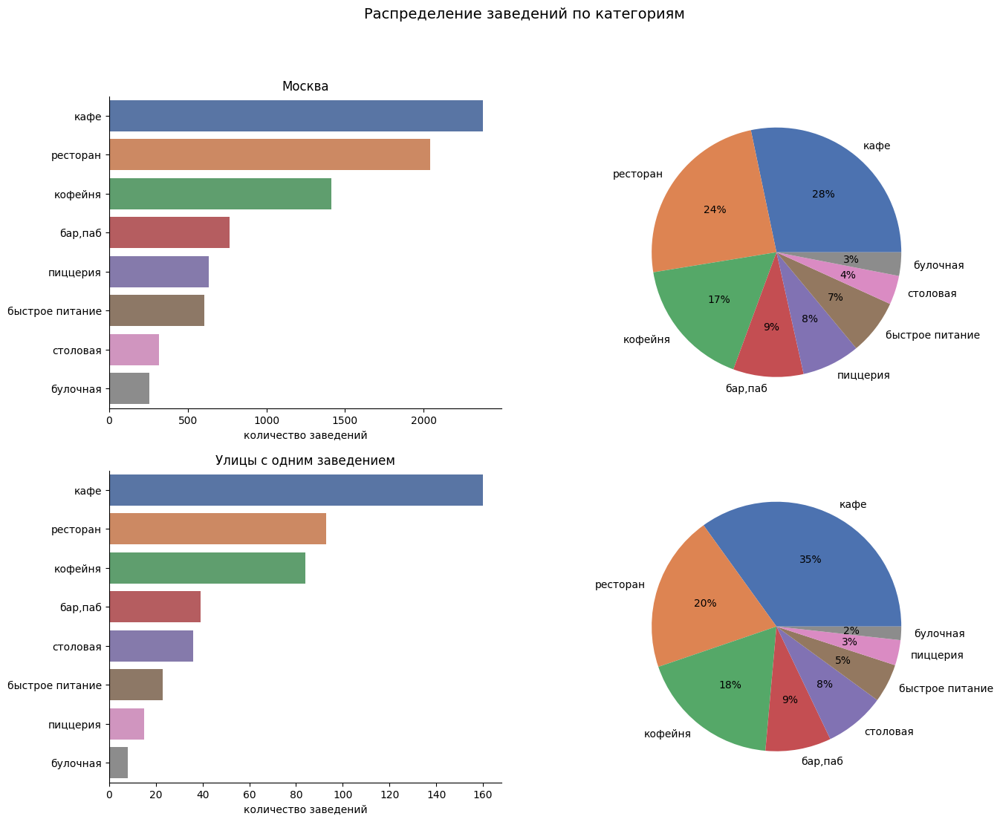

In [50]:
fig, ax = plt.subplots(2, 2)
fig.set_size_inches(15, 12)
fig.suptitle('Распределение заведений по категориям \n', fontsize = 14)

categories = df_un.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
# barplot with category size rating №1 (Moscow)

sns.barplot(ax=ax[0, 0], data=categories, x='name', y='category')
ax[0, 0].set(ylabel = None,
         xlabel='количество заведений',
            title='Москва')
ax[0, 0].spines['top'].set_visible(False)
ax[0, 0].spines['right'].set_visible(False)

# pie chart № 1 (Moscow)
colors = sns.color_palette('deep')
ax[0, 1].pie(categories.name, labels=categories.category, colors=colors, autopct='%1.0f%%')

categories = lonely_streets_df.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
# barplot with category size rating №2 (one place on the street)

sns.barplot(ax=ax[1, 0], data=categories, x='name', y='category')
ax[1, 0].set(ylabel = None,
         xlabel='количество заведений',
            title='Улицы с одним заведением')
ax[1, 0].spines['top'].set_visible(False)
ax[1, 0].spines['right'].set_visible(False)

# pie chart № 1 (one place on the street)
colors = sns.color_palette('deep')
ax[1, 1].pie(categories.name, labels=categories.category, colors=colors, autopct='%1.0f%%')

plt.show()

В целом распределение совпадает, но поменялись местами пиццерии и столовые: столовые чаще единственное заведение на своей улице

Отметим на карте заведения без конкурентов на своей улице:

In [51]:
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
claster_catering = MarkerCluster().add_to(moscow_map)

lonely_streets_df.apply(filling_claster, axis=1)
moscow_map

- Заведения расположены на улицах малой протяженности
- Во всех частях города хватает таких улиц/заведений: они есть и в самом центре, и на окраинах

Визуализируем медианные цены по округам:

In [52]:
district_vs_median_bill = (df_un.groupby('district')['middle_avg_bill']
                      .median()
                      .reset_index()
                      .sort_values(by='middle_avg_bill', 
                                   ascending=False))
district_vs_median_bill

,district,middle_avg_bill
1,Западный административный округ,"1,000.00"
5,Центральный административный округ,"1,000.00"
4,Северо-Западный административный округ,700.00
2,Северный административный округ,650.00
7,Юго-Западный административный округ,600.00
0,Восточный административный округ,575.00
3,Северо-Восточный административный округ,500.00
8,Южный административный округ,500.00
6,Юго-Восточный административный округ,450.00


In [53]:
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_vs_median_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Медианный счет заведений по районам',
).add_to(moscow_map)

moscow_map

- Самые высокие цены в Центральном и Западном округах -- медианный чек по заведениям достигает 1000 рублей
- В остальных округах цены ниже, самые низкие в Северо-Восточном, Южном и Юго-Восточном -- 500 рублей и ниже

Визуализируем комплексную метрику, учитывающую рейтинг заведений и цену в них:

In [54]:
district_vs_rating_vs_median_bill = district_vs_rating.merge(district_vs_median_bill, on='district')
district_vs_rating_vs_median_bill['rating_div_bill'] = (district_vs_rating_vs_median_bill.rating 
                                                        / district_vs_rating_vs_median_bill.middle_avg_bill * 1000)

district_vs_rating_vs_median_bill = district_vs_rating_vs_median_bill.sort_values(by='rating_div_bill', 
                                                                                  ascending=False)
district_vs_rating_vs_median_bill

,district,rating,middle_avg_bill,rating_div_bill
8,Юго-Восточный административный округ,4.10,450.00,9.11
3,Южный административный округ,4.18,500.00,8.37
7,Северо-Восточный административный округ,4.15,500.00,8.30
5,Восточный административный округ,4.17,575.00,7.26
6,Юго-Западный административный округ,4.17,600.00,6.95
1,Северный административный округ,4.24,650.00,6.52
2,Северо-Западный административный округ,4.21,700.00,6.01
0,Центральный административный округ,4.38,"1,000.00",4.38
4,Западный административный округ,4.18,"1,000.00",4.18


In [55]:
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=district_vs_rating_vs_median_bill,
    columns=['district', 'rating_div_bill'],
    key_on='feature.name',
    fill_color='PuBu',
    fill_opacity=0.8,
    legend_name='Отношение рейтинга к цене',
).add_to(moscow_map)

moscow_map

- Если учитывать рейтинг заведений совместно с их ценами, то лидерами являются Юго-Восточный, Южный и Северо-Восточный округи
- Заведения Центрального и Западного округов не выдерживают конкуренции по этому параметру и занимают две последние строки рейтинга

### **Вывод**

- В столице больше всего кафе, ресторанов и кофеен; меньше всего — булочных и столовых; промежуточное положение занимают бары, пиццерии и фастфуд
- В сложившемся рынке, в среднем, к крупным заведениям можно отнести рестораны и бары; к небольшим — булочные, пиццерии и кафе; к средним — кофейни, столовые, фастфуд
- Из всех заведений 40 % являются сетевыми, такие заведения бывают во всех категориях, однако, наиболее часто сетевыми бывают булочные, пиццерии и кофейни ( больше половины заведений); мало сетевых заведений в категориях баров, столовых и кафе (меньше трети заведений)
- В топ-15 наиболее крупных сетей большинство кофеен (треть рейтинга), кафе и ресторанов (по 20 %) , а также пиццерий (13 %)
- За исключением двух сетей, во всех крупнейших сетях средние цены и средние оценки
- Заведения в столице распределены очень неравномерно: огромное количество точек общепита в Центральном округе (более 2200), на втором месте округи Северный, Южный и Северо-Восточный, в каждом из которых около 900 заведений; в Восточном, Юго-Западном и Юго-Восточном округах количество заведений на уровне 700-800, а в Северо-Западном округе наименьшее количество — около 400
- По категориям заведений также есть отличия в средней оценке: бары получают самые высокие оценки, а точки фастфуда самые низкие;  рейтинг оценок различных заведений:


    1. Бар
    2. Ресторан
    3. Пиццерия, булочная
    4. Кофейня, столовая
    5. Кафе
    6. Быстрое питание
    
    
- Самые высокооцененные заведения находятся в Центральном округе, на втором и третьем местах Северный и Северо-Западный округи соответственно; самые низкооцененные заведения в Юго-Восточном округе; оставшиеся округи занимают промежуточное положение и их рейтинги примерно равны
- Самые высокие цены в Центральном и Западном округах -- медианный чек по заведениям достигает 1000 рублей; самые низкие в Северо-Восточном, Южном и Юго-Восточном -- 500 рублей и ниже; оставшиеся округи занимают промежуточное положение и их цены примерно равны
- В Москве есть протяженные улицы, на которых более 100 заведений, но есть и короткие улицы, где представлено всего одно заведение

**Рекомендации**


- Определиться с желаемым размером заведения: если есть средства открыть и желание управлять крупным бизнесом, имеет смысл обратить внимание, например, на рестораны, если нет — булочные или кафе
- Определиться с тем, хотим мы открыть собственное заведение или развиваться по франшизе: анализ рынка показал, что в категории булочных и кофеен очень много сетевых заведений, а вот в категории баров — меньше всего
- В каком округе хотим работать? На основании проведенного анализа можно выделить три самых интересных:
    - Центральный округ: самая большая проходимость, один из двух самых высоких средних чеков, однако, самая большая конкуренция по количеству и качеству заведений; высокий риск
    - Западный округ: проходимость ниже (не центр), но средний чек на уровне центра, а конкуренция ниже: округ медианный по количеству заведений, рейтинги заведений также медианные; средний риск
    - Северо-Западный округ — очень мало заведений, средний чек третий по величине в Москве, однако средний рейтинг заведений также третий по городу; низкий риск
- Какой категории заведение открывать? 
    - Бар: категория получает самые высокие оценки пользователей, таких мест не так много — чуть меньше 10 % всех заведений
    - Булочная: категория получает почти самые высокие оценки, таких мест очень мало в Москве — проще удивить гостей
    - Пиццерия — оценки на уровне булочных, таких мест примерно как баров

## Детализация: открытие кофейни

Рассмотрим подробнее категорию кофеен

Сколько всего кофеен в Москве?

In [56]:
print('Кофеен в Москве:')
print(df_un.query('category == "кофейня"').shape[0])

Кофеен в Москве:
1413


Довольно много, сколько это в долях?

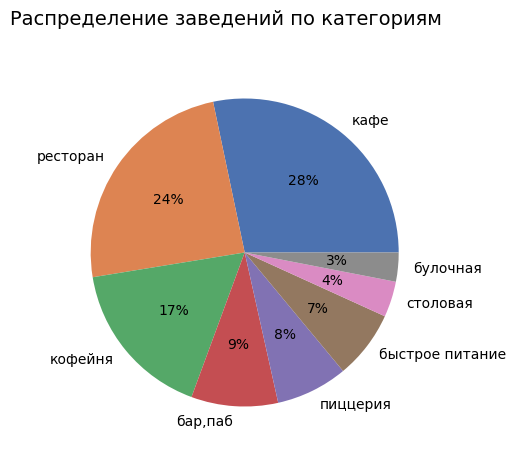

In [57]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 5)
fig.suptitle('Распределение заведений по категориям', fontsize = 14)

categories = df_un.groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)
# круговая диаграмма
colors = sns.color_palette('deep')
ax.pie(categories.name, labels=categories.category, colors=colors, autopct='%1.0f%%')

plt.show()

Кофейни на третьем месте по популярности и составляют 17 % от всех заведений общепита Москвы

Как кофейни распределены по районам?

In [58]:
fig = px.bar(district_vs_cat.sort_values(by='кофейня'), 
             x=['кофейня'], 
             y='district', 
             title="Количество кофеен по районам Москвы")
fig.update_xaxes(title='Количество заведений')
fig.update_yaxes(title='')
fig.update_layout(showlegend=False)
fig.show()

- В абсолютном выражении больше всего кофеен (с большим отрывом) в Центральном округе;
- На втором месте Северный округ;
- На последнем месте Северо-Западный округ.

Визуализируем все кофейни на карте:

In [59]:
coffee_shops = df_un.query('category == "кофейня"')

moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
claster_catering = MarkerCluster().add_to(moscow_map)

coffee_shops.apply(filling_claster, axis=1)
moscow_map

Нет какого-то характерного паттерна расположения кофеен: встречаются на крупных проспектах и на маленьких улицах, разряженно разбросаны по площади, но в местах большей проходимости могут соседствовать друг с другом и другими заведениями

Рассмотрим, есть ли круглосуточные кофейни:

In [60]:
coffee_shops.query('is_24_7 == True').head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.88,37.54,3.50,NaN,NaN,NaN,NaN,True,20.00,Дмитровское шоссе,True
971,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.87,37.71,4.00,NaN,NaN,NaN,NaN,True,25.00,Ярославское шоссе,True
1047,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.85,37.68,4.50,NaN,Цена чашки капучино:140–200 ₽,NaN,170.00,True,NaN,Ярославское шоссе,True
1214,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.81,37.39,4.30,NaN,NaN,NaN,NaN,True,NaN,МКАД,True
1291,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.79,37.49,4.20,средние,Средний счёт:650–850 ₽,750.00,NaN,True,200.00,улица Народного Ополчения,True


In [61]:
coffee_shop_24_7_cnt = coffee_shops.query('is_24_7 == True').shape[0]
print(f'Круглосуточных кофеен в Москве: {coffee_shop_24_7_cnt} ({(coffee_shop_24_7_cnt / coffee_shops.shape[0]):.0%} от всех кофеен)')

Круглосуточных кофеен в Москве: 59 (4% от всех кофеен)


**Круглосуточная кофейня -- не самый популярный формат, их меньше 5 %**

Рассмотрим рейтинги кофеен

count   1,413.00
mean        4.28
std         0.37
min         1.40
25%         4.10
50%         4.30
75%         4.40
max         5.00
Name: rating, dtype: float64

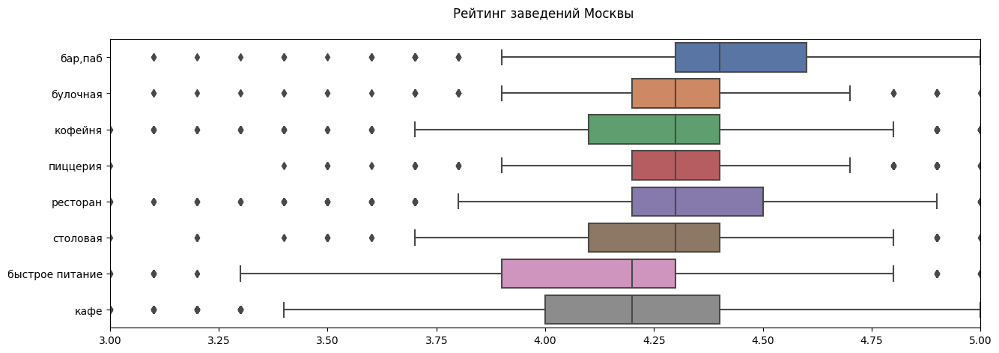

In [62]:
fig, ax = plt.subplots()

fig.set_size_inches(15, 5)
sns.boxplot(x="rating", y="category", data=df_un, order=order, ax=ax)
ax.set(title='Рейтинг заведений Москвы \n',
         ylabel=None,
         xlabel=None,
         xlim=(3, 5));

coffee_shops.rating.describe()

- Кофейни делят четвертое место со столовыми в рейтинге самых высокооцененных категорий заведений
- Три четверти кофеен имеют рейтинг 4.1 и выше
- Четверть кофеен имеют рейтинг 4.4 и выше
- Заведения с рейтингом ниже 3.7 и выше 4.8 встречаются редко и их можно назвать выбросами

Посмотрим, как распределяются рейтинги кофеен по районам Москвы:

In [63]:
district_vs_rating_coffee = (coffee_shops.groupby('district')['rating']
                      .mean()
                      .reset_index()
                      .sort_values(by='rating', 
                                   ascending=False))
district_vs_rating_coffee.district = district_vs_rating_coffee.district.str.replace(' административный округ', '')
district_vs_rating_coffee

,district,rating
5,Центральный,4.34
4,Северо-Западный,4.33
2,Северный,4.29
7,Юго-Западный,4.28
0,Восточный,4.28
8,Южный,4.23
6,Юго-Восточный,4.23
3,Северо-Восточный,4.22
1,Западный,4.20


- Лучшие кофейни в Центральном и Северо-Западном округах
- На втором месте Северный, Юго-Западный и Восточный округи
- Предпоследнее место занимают Южный и Юго-восточный районы
- Самые низкие оценки у кофеен в Северо-Восточном и Западном округах

Рассмотрим распределение цен в кофейнях по районам:

,district,middle_coffee_cup
0,Юго-Западный,198.00
1,Центральный,190.00
2,Западный,189.00
3,Северо-Западный,165.00
4,Северо-Восточный,162.50
5,Северный,159.00
6,Южный,150.00
7,Юго-Восточный,147.50
8,Восточный,135.00


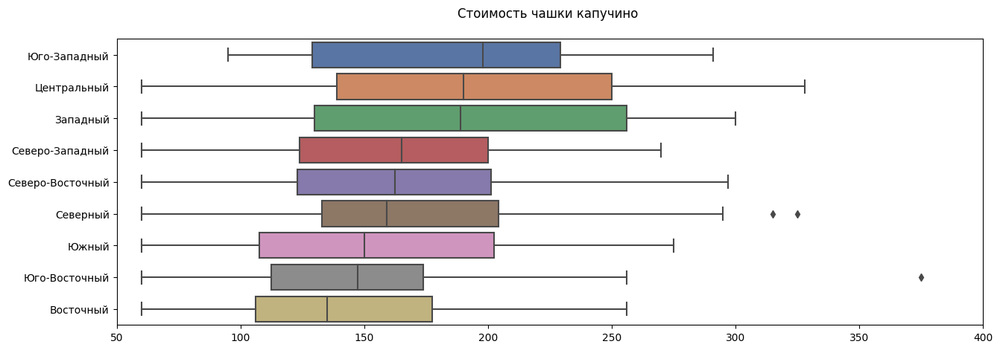

In [64]:
order = coffee_shops.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).index
order = order.str.replace(' административный округ', '')

coffee_shops_vs_cup = coffee_shops.copy()
coffee_shops_vs_cup.district = coffee_shops_vs_cup.district.str.replace(' административный округ', '')


fig, ax = plt.subplots()

fig.set_size_inches(15, 5)
sns.boxplot(x="middle_coffee_cup", y="district", data=coffee_shops_vs_cup, order=order, ax=ax)
ax.set(title='Стоимость чашки капучино \n',
         ylabel=None,
         xlabel=None,
         xlim=(50, 400));

median_cup = coffee_shops.groupby('district')['middle_coffee_cup'].median().sort_values(ascending=False).reset_index()
median_cup.district = median_cup.district.str.replace(' административный округ', '')
median_cup

- Разброс цен в кофейнях довольно большой: медианная стоимость чашки капучино в диапазоне 135-200 рублей в зависимости от района
- Самая большая медиана цены чашки капучино в Юго-Западном районе: почти 200 рублей
- Самая низкая медиана в Восточном округе: 135 рублей
- В целом самые большие цены в Центральном и Западном округах: 25 % кофеен просят за чашку капучино больше 240-250 рублей

### **Вывод**


- Кофейни — очень популярный вид общепита в Москве, они составляют 17 % всех заведений
- Больше всего кофеен в Центральном округе, меньше всего — в Северо-Западном, Юго-Восточном, Юго-Западном и Восточном округах; промежуточное количество в Северном, Северо-Восточном, Западном и Южном округах;
- Менее 5 % всех кофеен — круглосуточные
- Кофейни — не самые высокооцениваемые заведения Москвы, они занимают четвертое/пятое место в рейтинге категорий общепита
- Лучшие кофейни в Центральном и Северо-Западном округах;  на втором месте Северный, Юго-Западный и Восточный округи; 	предпоследнее место занимают Южный и Юго-восточный районы; самые низкие оценки у кофеен в Северо-Восточном и Западном округах
- Самые высокие цены в Юго-Западном, Центральном и Западном округах; самые низкие в Южном, Юго-Восточном и Восточном округах; средние цены в округах Северо-Западный, Северо-Восточный и Северный

**Рекомендации**


- Круглосуточный характер работы не востребован
- Цены следует несколько снизить относительно ближайших конкурентов для привлечения гостей в заведение
- Перспективные округи:
    - Центральный : самая большая проходимость, один из самых высоких средних чеков, однако, самая большая конкуренция по количеству и качеству заведений; ожидаемая цена чашки капучино у конкурентов ~ 140-250 рублей
    - Западный: цены на уровне центра, оценки заведений-конкурентов низкие, количество конкурентов среднее (четвертое место в рейтинге); ожидаемая цена чашки капучино у конкурентов ~ 130-250 рублей
    - Юго-Западный: цены на уровне центра, оценки у конкурентов хорошие, кофеен мало (третье с конца место в рейтинге); ожидаемая цена чашки капучино у конкурентов ~ 130-225 рублей


**Презентация:** https://drive.google.com/file/d/18Jpu-dD36BfiQVEtwB9qGJONogEEFxcT/view?usp=sharing